In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Load the dataset to inspect its structure and contents
file_path = 'data/278k_labelled_uri.csv'
data = pd.read_csv(file_path)

# Display basic information about the dataset
data_info = data.info()
data_head = data.head()

data_info, data_head

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277938 entries, 0 to 277937
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0.1      277938 non-null  int64  
 1   Unnamed: 0        277938 non-null  int64  
 2   duration (ms)     277938 non-null  float64
 3   danceability      277938 non-null  float64
 4   energy            277938 non-null  float64
 5   loudness          277938 non-null  float64
 6   speechiness       277938 non-null  float64
 7   acousticness      277938 non-null  float64
 8   instrumentalness  277938 non-null  float64
 9   liveness          277938 non-null  float64
 10  valence           277938 non-null  float64
 11  tempo             277938 non-null  float64
 12  spec_rate         277938 non-null  float64
 13  labels            277938 non-null  int64  
 14  uri               277938 non-null  object 
dtypes: float64(11), int64(3), object(1)
memory usage: 31.8+ MB


(None,
    Unnamed: 0.1  Unnamed: 0  duration (ms)  danceability  energy  loudness  \
 0             0           0       195000.0         0.611   0.614    -8.815   
 1             1           1       194641.0         0.638   0.781    -6.848   
 2             2           2       217573.0         0.560   0.810    -8.029   
 3             3           3       443478.0         0.525   0.699    -4.571   
 4             4           4       225862.0         0.367   0.771    -5.863   
 
    speechiness  acousticness  instrumentalness  liveness  valence    tempo  \
 0       0.0672        0.0169          0.000794    0.7530    0.520  128.050   
 1       0.0285        0.0118          0.009530    0.3490    0.250  122.985   
 2       0.0872        0.0071          0.000008    0.2410    0.247  170.044   
 3       0.0353        0.0178          0.000088    0.0888    0.199   92.011   
 4       0.1060        0.3650          0.000001    0.0965    0.163  115.917   
 
       spec_rate  labels                 

# 1. Distribution of Audio Features

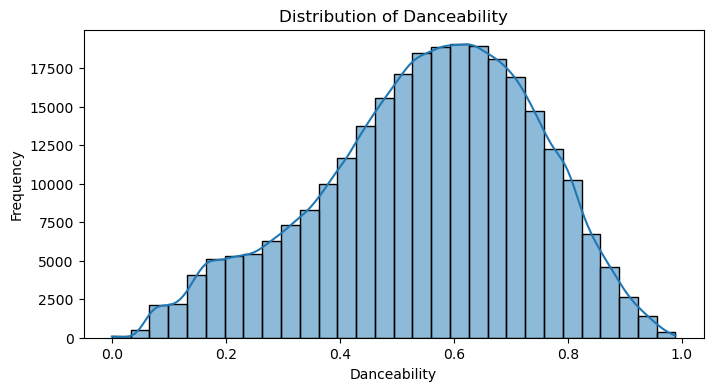

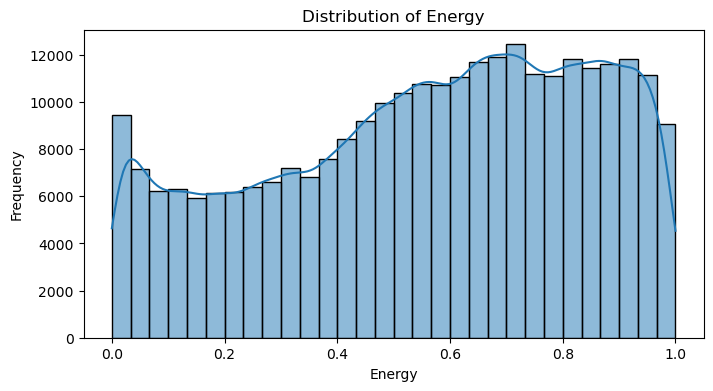

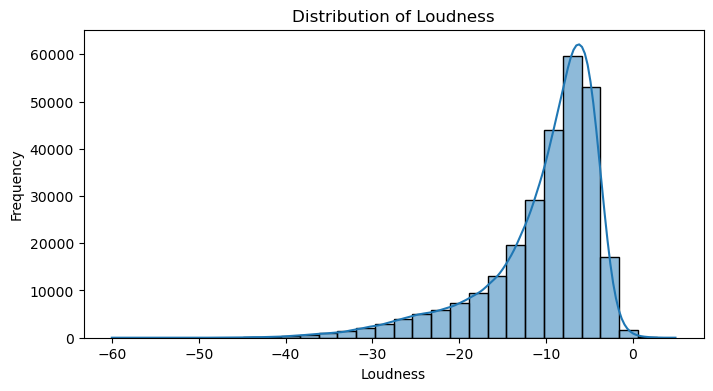

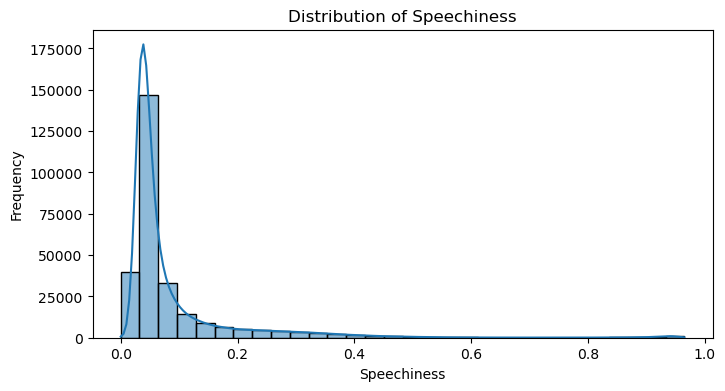

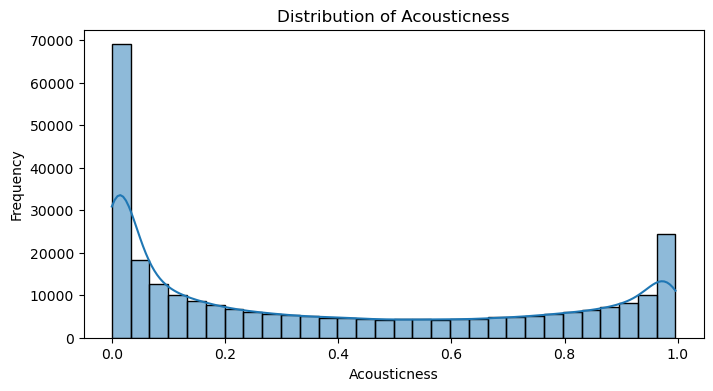

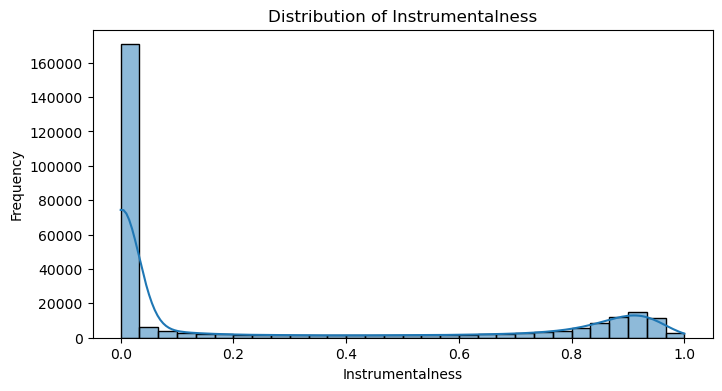

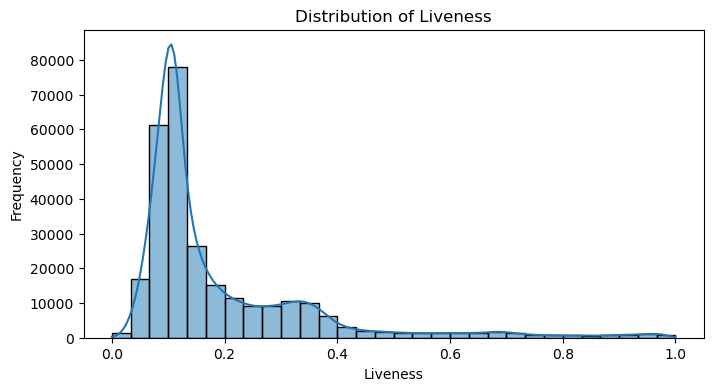

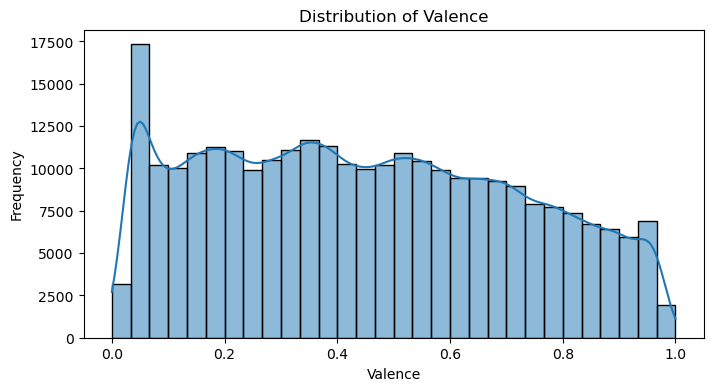

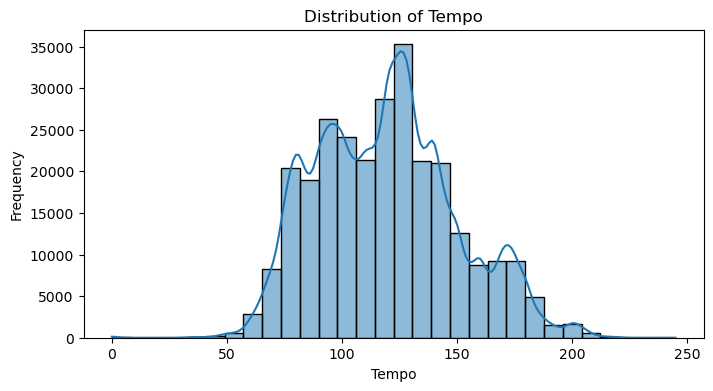

In [3]:
# Set plot style for clarity
plt.style.use("default")

# Distribution of Audio Features
audio_features = ['danceability', 'energy', 'loudness', 'speechiness', 
                  'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Plot histograms for each audio feature
for feature in audio_features:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[feature].dropna(), bins=30, kde=True)
    plt.title(f'Distribution of {feature.capitalize()}')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Frequency')
    plt.show()

## Conclusion - Distribution of Audio Features

The distributions of audio features reveal the nature of typical songs in the dataset. Features like danceability and energy follow relatively normal distributions, indicating a standard range for these qualities in most songs. Conversely, features like instrumentalness and speechiness are heavily skewed toward zero, suggesting that purely instrumental or highly speech-focused tracks are rare. This highlights a focus on mainstream, balanced compositions with a mix of musical elements.

# 2. Correlation Heatmap

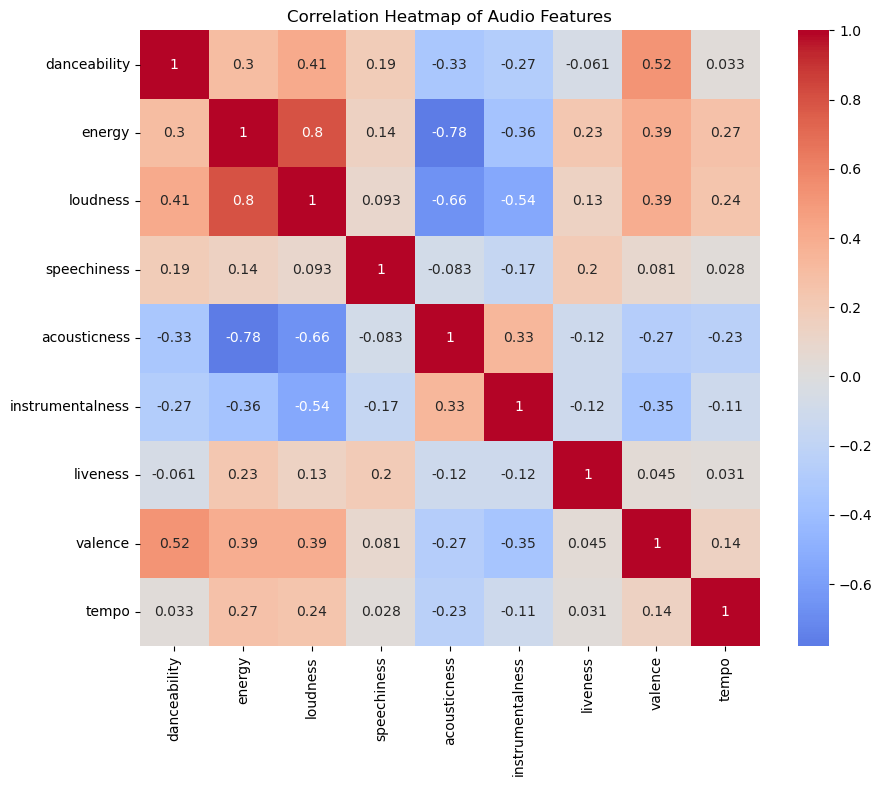

In [4]:
plt.figure(figsize=(10, 8))
sns.heatmap(data[audio_features].corr(), annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Audio Features")
plt.show()

## Conclusion - Correlation Heatmap

The heatmap uncovers relationships between different audio features, with a notable positive correlation between energy and loudness, indicating that louder songs generally have high energy. Meanwhile, weak correlations among most other features imply that tracks exhibit varied combinations of musical elements without one feature strongly predicting another. This diversity could be beneficial for categorization and genre classification based on nuanced feature blends.

# 3. Track Duration Analysis

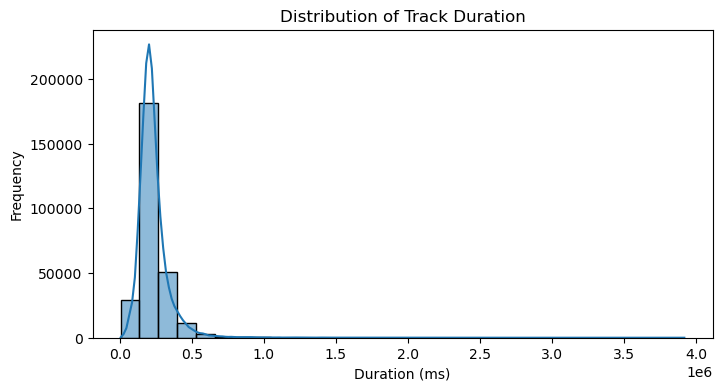

In [5]:
plt.figure(figsize=(8, 4))
sns.histplot(data['duration (ms)'].dropna(), bins=30, kde=True)
plt.title("Distribution of Track Duration")
plt.xlabel("Duration (ms)")
plt.ylabel("Frequency")
plt.show()

## Conclusion - Track Duration Analysis

Track duration centers around a typical range (2-4 minutes), aligning with common song lengths in popular music. The presence of some outliers (very short or very long tracks) suggests occasional inclusion of unique formats, such as interludes or extended mixes. This typical distribution reinforces standard track lengths, with minimal deviation except for special cases.

# 4. Track Duration vs Tempo Scatter Plot

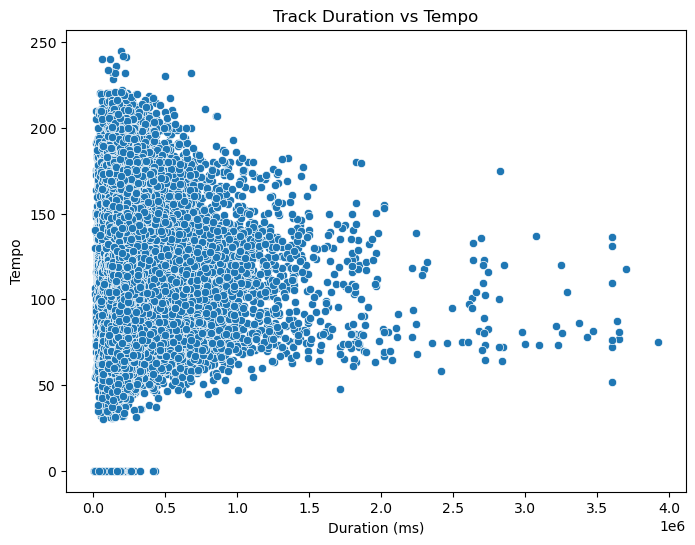

In [6]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['duration (ms)'], y=data['tempo'])
plt.title("Track Duration vs Tempo")
plt.xlabel("Duration (ms)")
plt.ylabel("Tempo")
plt.show()

## Conclusion - Track Duration vs Tempo Scatter Plot 

There’s no observable trend between track duration and tempo, suggesting that tempo isn’t affected by a song’s length. This lack of association means that fast-paced and slow-paced songs exist across the entire range of track durations, which may reflect the diversity of musical styles that are fast, slow, brief, or extended.

# 5. Feature Comparison by Labels (Danceability by Labels)

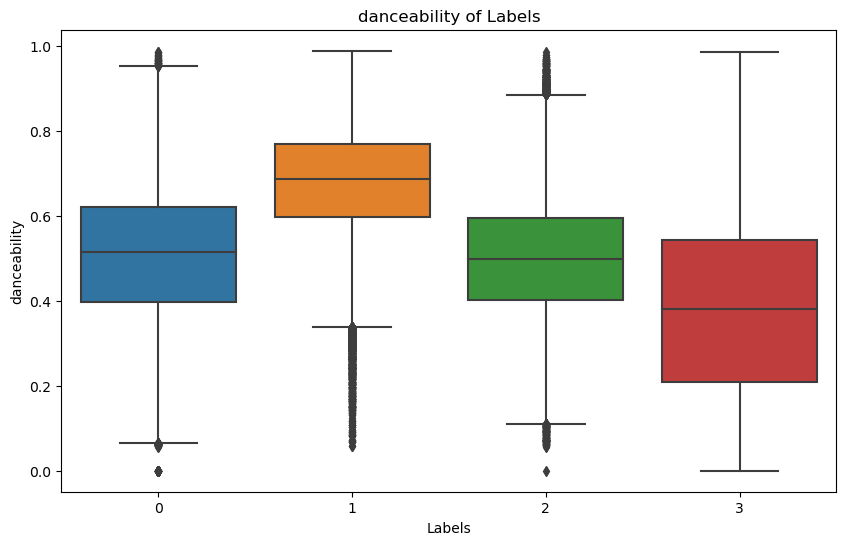

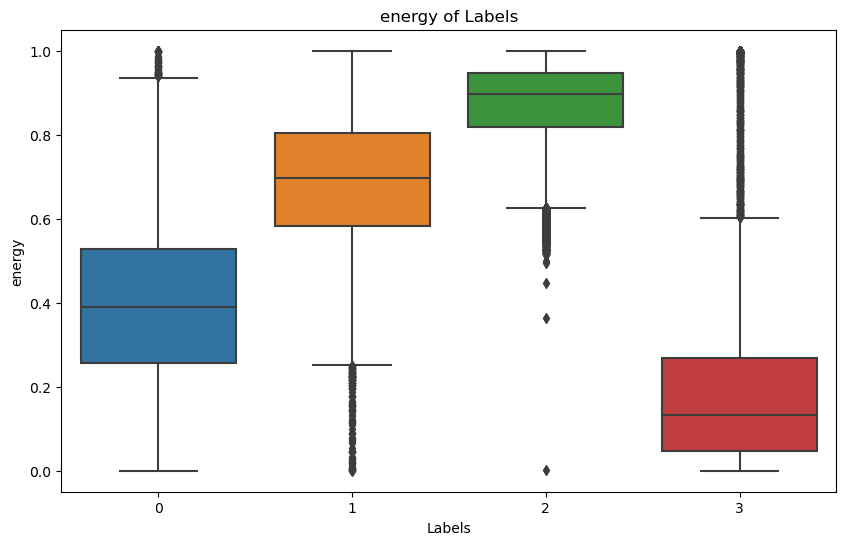

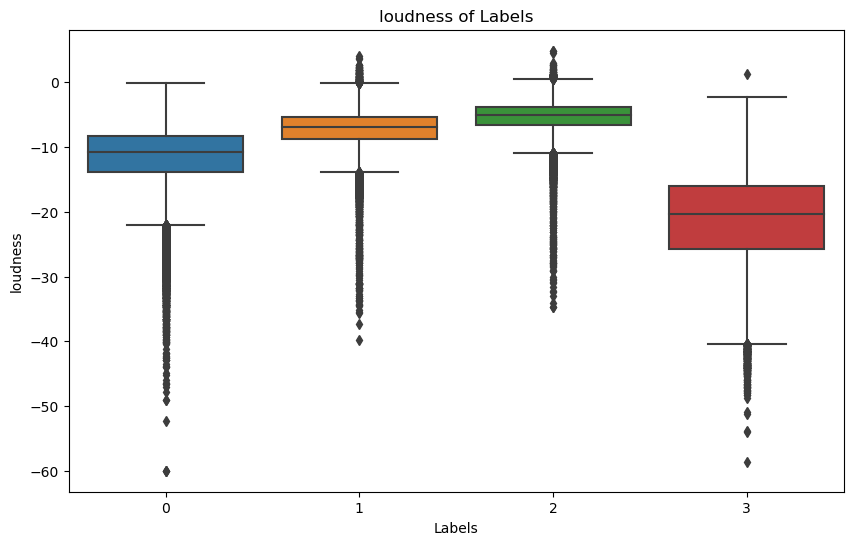

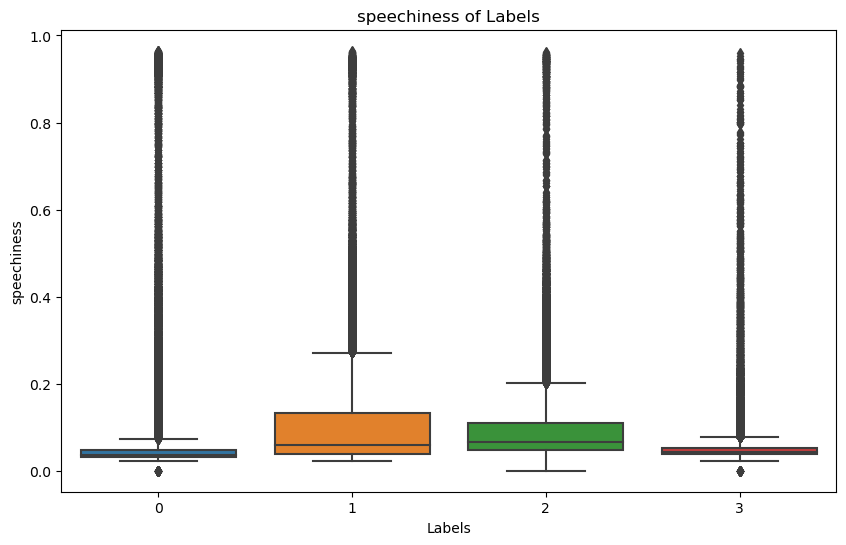

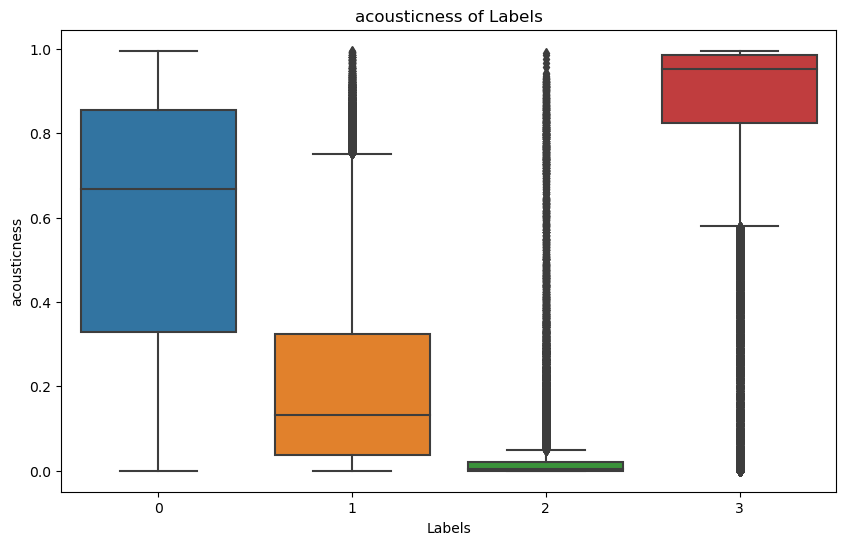

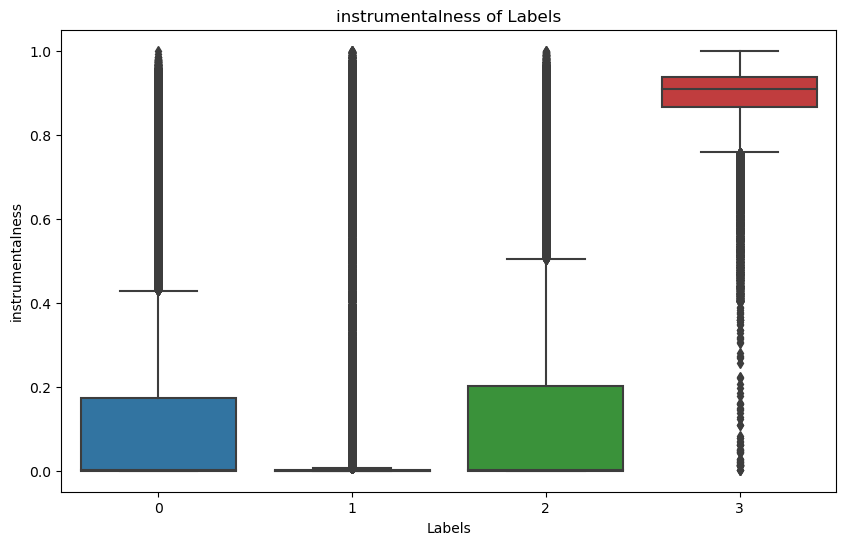

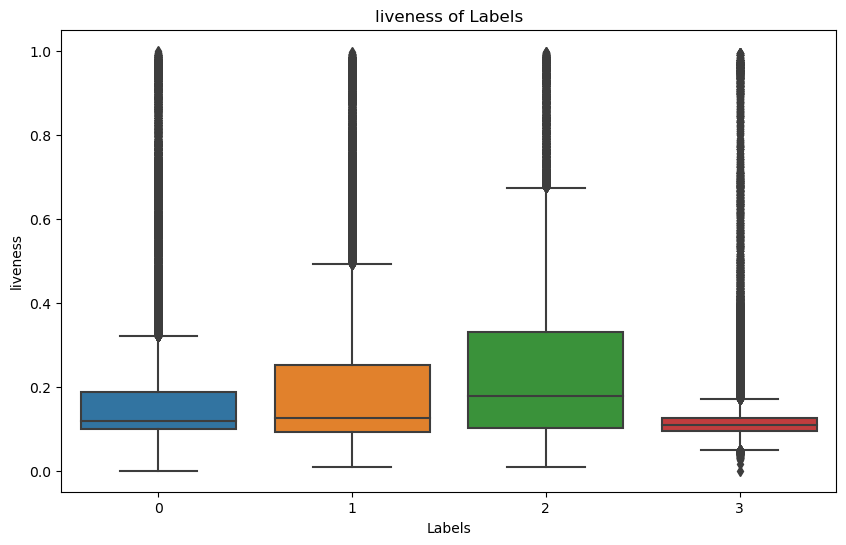

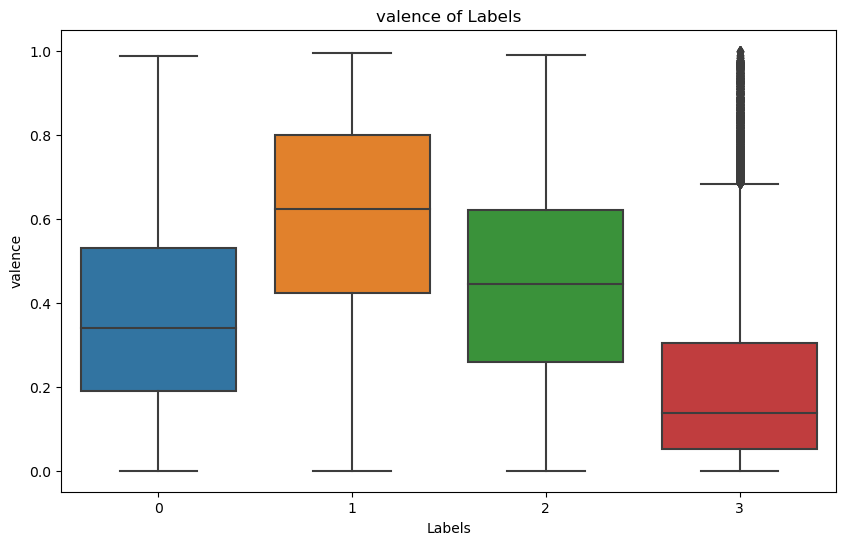

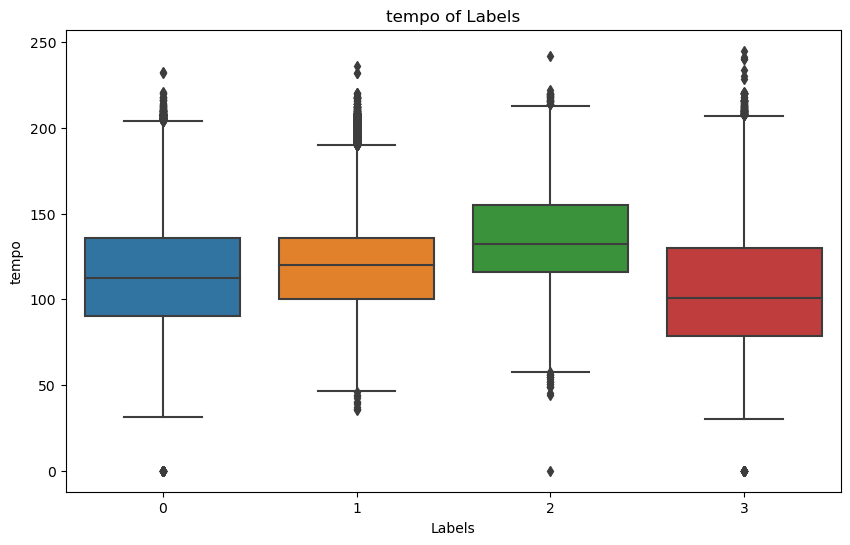

In [15]:
for feature in audio_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data['labels'], y=data[feature])
    plt.title(f"{feature} of Labels")
    plt.xlabel("Labels")
    plt.ylabel(f"{feature}")
    plt.show()

## Conclusion - Feature Comparison by Labels (Danceability by Labels)
The danceability box plot reveals clear differences across labels, likely representing genres. Certain labels have consistently higher danceability, hinting that they may align with dance-oriented genres like pop or electronic. This variation provides insight into genre distinctions, as danceable qualities vary based on intended listening contexts, like dance floors versus casual listening.

# 6. Tempo vs. Energy Scatter Plot

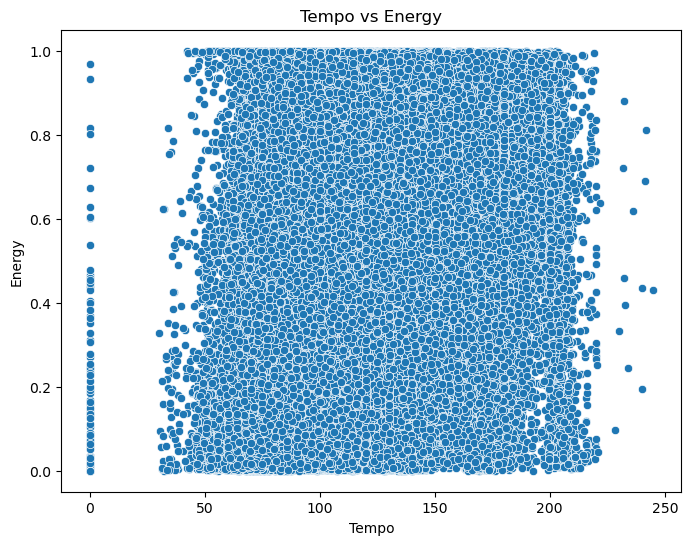

In [8]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['tempo'], y=data['energy'])
plt.title("Tempo vs Energy")
plt.xlabel("Tempo")
plt.ylabel("Energy")
plt.show()

## Conclusion - Tempo vs. Energy Scatter Plot
Although there is a positive association between tempo and energy, this relationship isn’t strict, as fast songs can still have low energy, and slower songs can be highly energetic. This variation reflects the flexibility in music production, where tempo and energy are adjusted independently to achieve different artistic effects.

# 7. Instrumentalness and Acousticness Scatter Plot

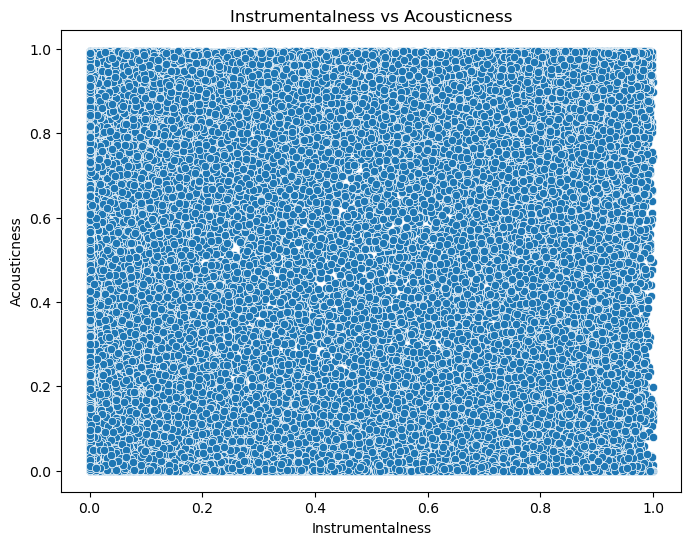

In [9]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['instrumentalness'], y=data['acousticness'])
plt.title("Instrumentalness vs Acousticness")
plt.xlabel("Instrumentalness")
plt.ylabel("Acousticness")
plt.show()

# Conclusion - Instrumentalness and Acousticness Scatter Plot
Tracks with high instrumentalness often correspond to higher acousticness, suggesting that purely instrumental tracks lean toward acoustic sounds. However, the spread of values indicates that not all instrumental tracks are acoustic and vice versa, pointing to a diversity of production styles within instrumental and acoustic-focused tracks.

# 8. Valence and Danceability Relationship

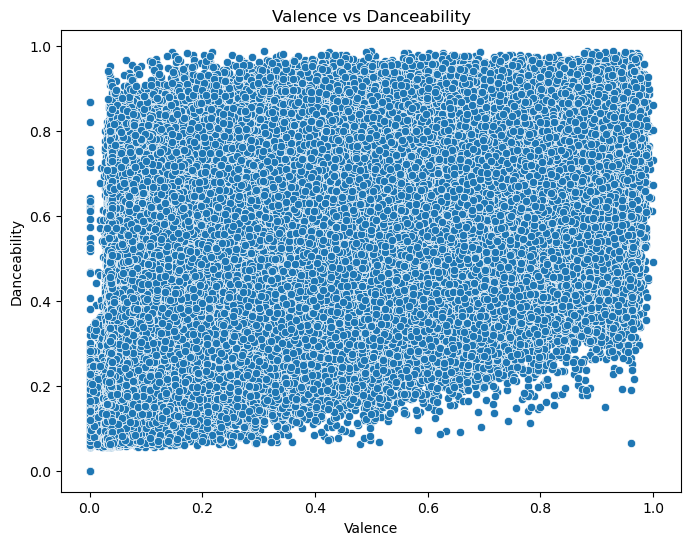

In [10]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['valence'], y=data['danceability'])
plt.title("Valence vs Danceability")
plt.xlabel("Valence")
plt.ylabel("Danceability")
plt.show()

# Conclusion - Valence and Danceability Scatter Plot
There’s a moderate positive trend between valence (positivity) and danceability, meaning that upbeat songs are often more danceable. Nevertheless, exceptions exist where low-valence tracks are still highly danceable, which could represent genres that emphasize rhythm without necessarily being upbeat, such as certain dance or techno styles.

# Outlier Detection Visualizations

# 9. Box Plots for Outliers in Each Feature

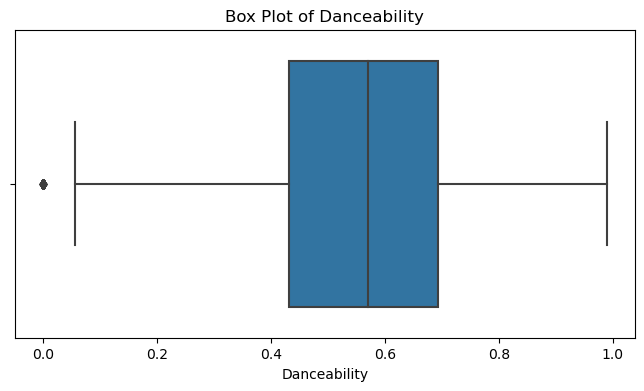

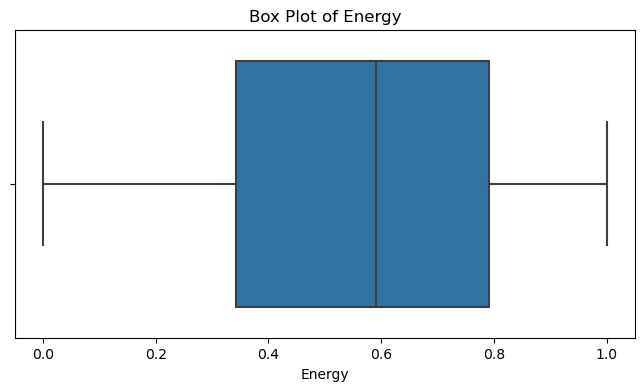

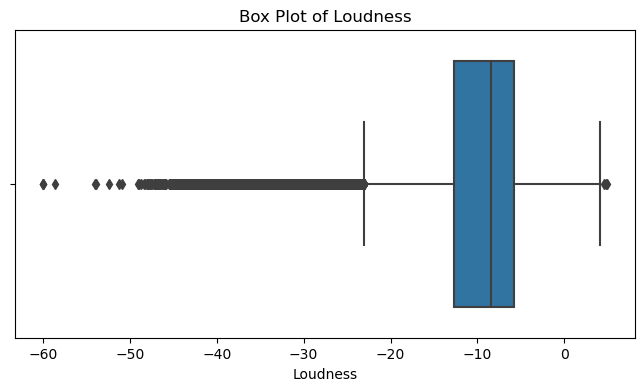

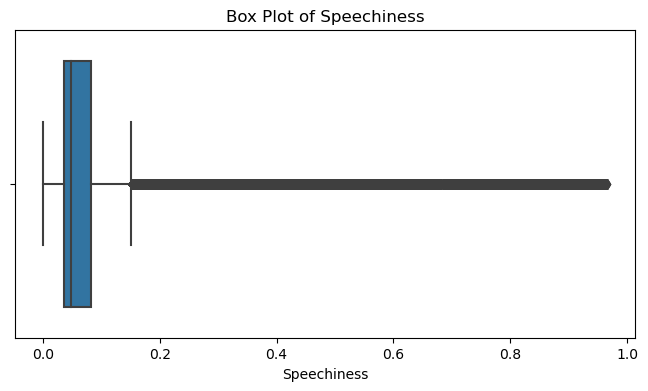

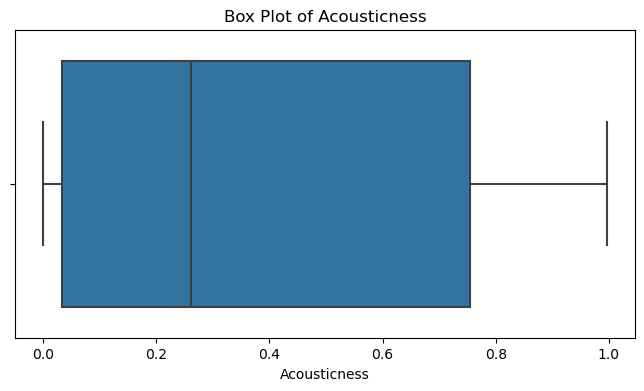

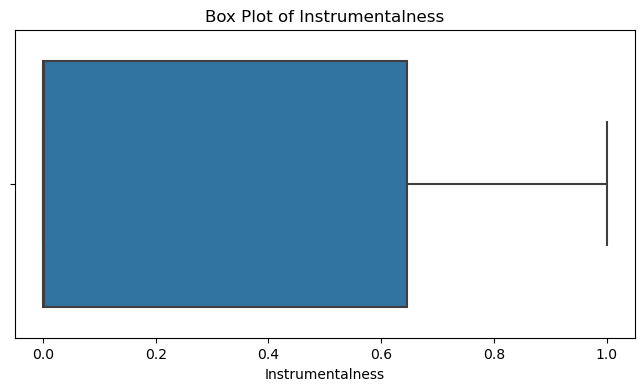

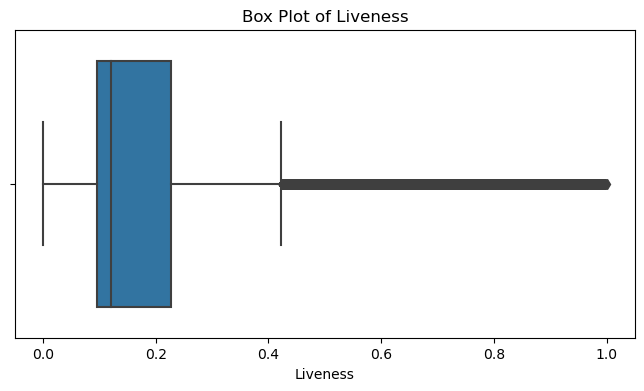

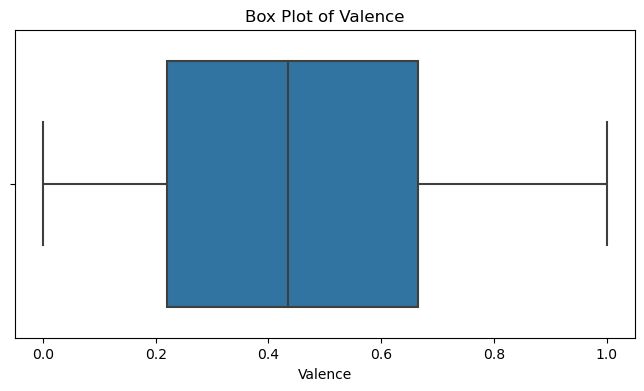

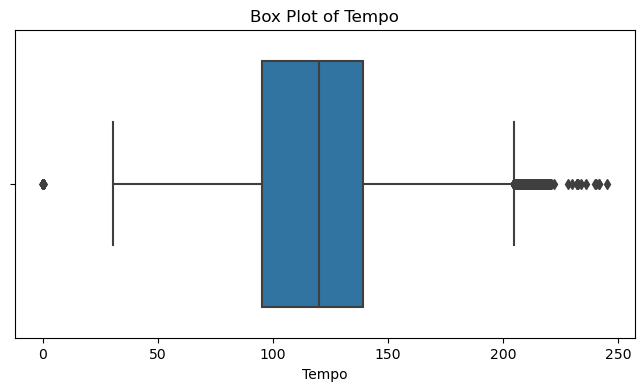

In [11]:
for feature in audio_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=data[feature].dropna())
    plt.title(f'Box Plot of {feature.capitalize()}')
    plt.xlabel(feature.capitalize())
    plt.show()

## Conclusion - Box Plots for Outliers in Each Feature
The box plots show that nearly all audio features contain some outliers, particularly in instrumentalness and speechiness, where extreme values are more common. These outliers likely represent specialized tracks, like spoken-word or ambient music, which are structurally different from mainstream music in the dataset.

# 10. Z-Score Analysis: Highlight Outliers in Scatter Plots (Energy vs Tempo, Loudness vs Valence, Danceability vs Acousticness)

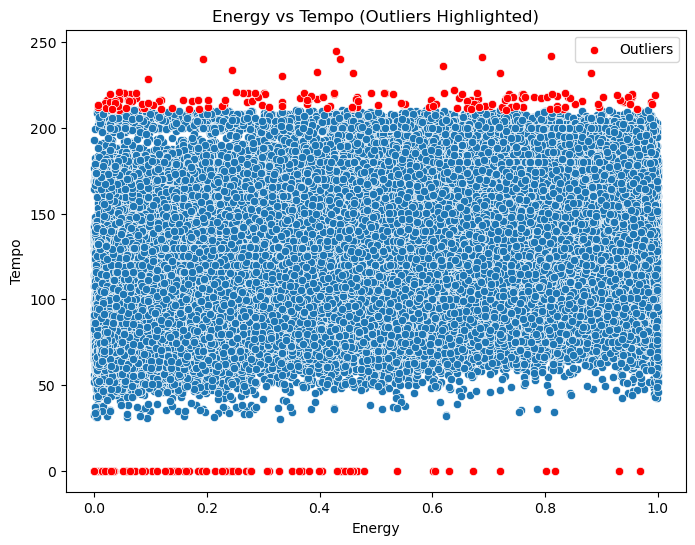

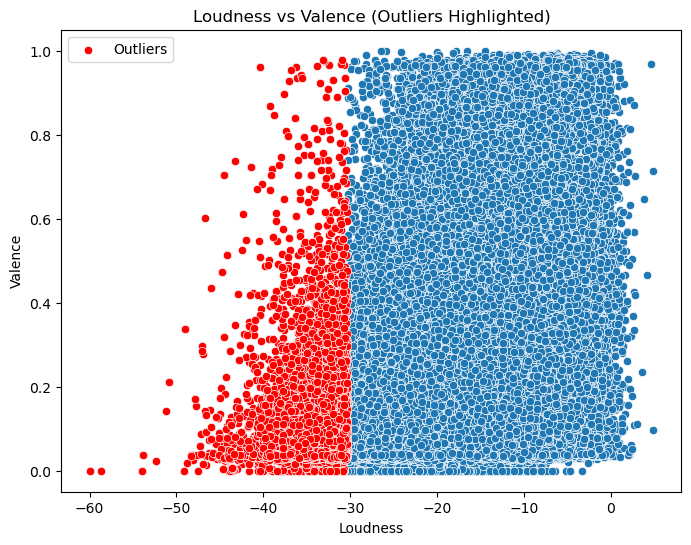

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


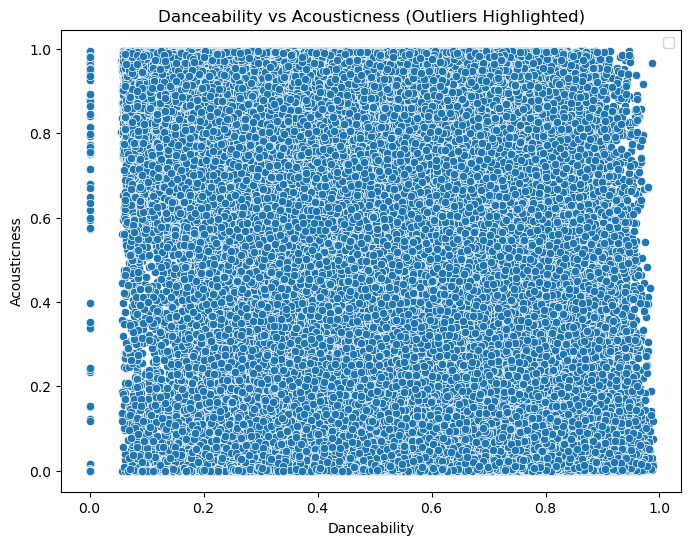

In [12]:
from scipy.stats import zscore
outlier_threshold = 3
outliers_data = data[audio_features].dropna().apply(zscore).abs() > outlier_threshold

# Scatter plots with outliers highlighted
highlight_color = 'red'
pairs = [('energy', 'tempo'), ('loudness', 'valence'), ('danceability', 'acousticness')]

for feature_x, feature_y in pairs:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=data[feature_x], y=data[feature_y])
    
    # Highlighting outliers in scatter plot
    if feature_x in outliers_data.columns and feature_y in outliers_data.columns:
        outliers = outliers_data[feature_x] | outliers_data[feature_y]
        outliers_index = outliers.index[outliers].tolist()
        
        sns.scatterplot(x=data[feature_x].iloc[outliers_index], 
                        y=data[feature_y].iloc[outliers_index], 
                        color=highlight_color, label="Outliers")
    
    plt.title(f'{feature_x.capitalize()} vs {feature_y.capitalize()} (Outliers Highlighted)')
    plt.xlabel(feature_x.capitalize())
    plt.ylabel(feature_y.capitalize())
    plt.legend()
    plt.show()

## Conclusion - Z-Score Analysis with Highlighted Outliers in Scatter Plots
Outliers in scatter plots, identified via z-scores, reveal unusual combinations of features, such as very high tempo but low energy. These points indicate songs that diverge from typical feature relationships, possibly due to experimental or niche music styles, which deviate from mainstream characteristics.

# 11. Pair Plot for Multi-Feature Outliers

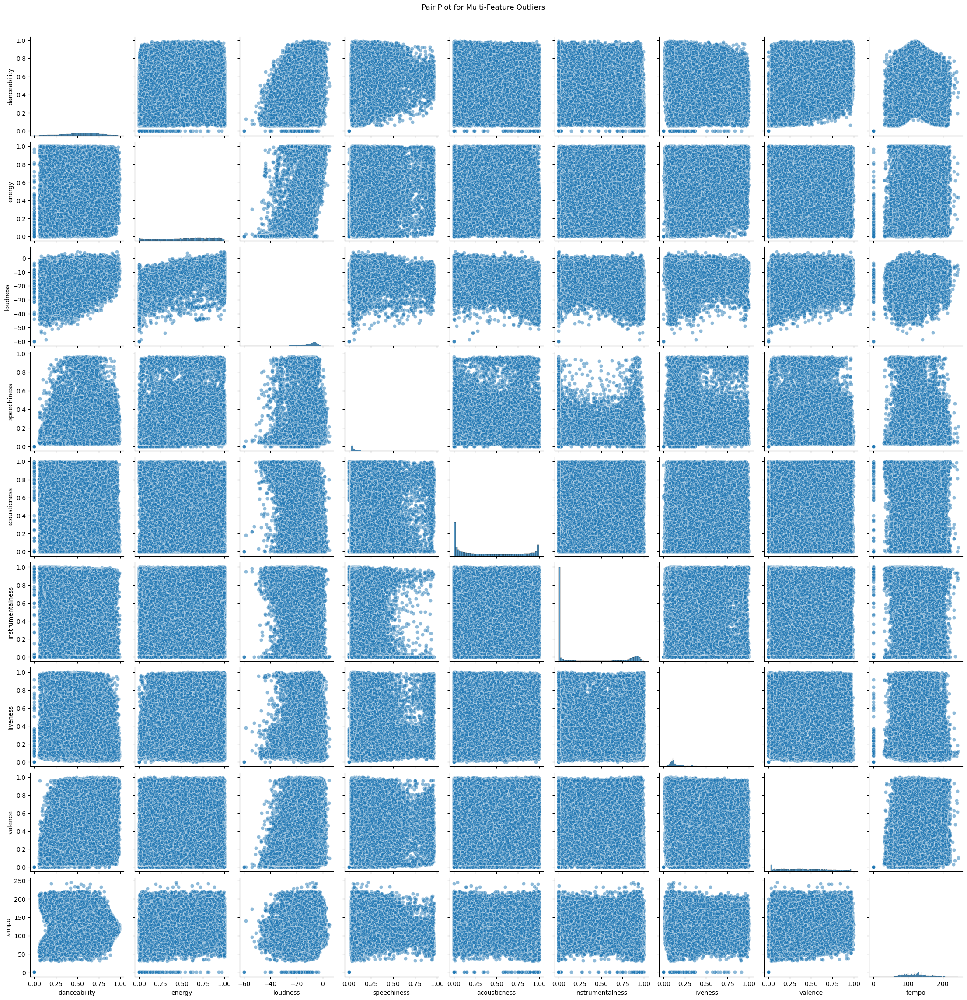

In [13]:
sns.pairplot(data[audio_features].dropna(), plot_kws={'alpha': 0.5})
plt.suptitle("Pair Plot for Multi-Feature Outliers", y=1.02)
plt.show()

# Conclusion - Pair Plot for Multi-Feature Outliers
The pair plot highlights clusters of tracks with similar feature values and isolated outliers with unique feature combinations. These multi-dimensional outliers represent rare musical profiles that stand out from the dataset’s general patterns, providing insight into uncommon track structures or genre-blending styles.